# Install and import Libraries

In [5]:
! pip install ultralytics easyocr hezar mtcnn insightface onnxruntime retina-face

In [6]:
import cv2
import numpy as np
from ultralytics import YOLO
import easyocr
from google.colab.patches import cv2_imshow
import os
import pandas as pd
import re
from hezar.models import Model
import insightface
from mtcnn.mtcnn import MTCNN

In [45]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Read kibord dataset

In [ ]:
import gdown
import zipfile
import os

In [ ]:
file_id = "1EP7JhNFoLtlmJCabhrpTYOkMJ2c_OyMM"
dataset_zip_path = "/content/dataset.zip"
extract_path = "/content/dataset"

In [ ]:
gdown.download(f"https://drive.google.com/uc?id={file_id}", dataset_zip_path, quiet=False)

with zipfile.ZipFile(dataset_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Dataset downloaded and extracted successfully!")


Downloading...
From (original): https://drive.google.com/uc?id=1EP7JhNFoLtlmJCabhrpTYOkMJ2c_OyMM
From (redirected): https://drive.google.com/uc?id=1EP7JhNFoLtlmJCabhrpTYOkMJ2c_OyMM&confirm=t&uuid=7bda8adf-0d3a-4cfe-81f7-bca300ce0e74
To: /content/dataset.zip
100%|██████████| 539M/539M [00:02<00:00, 205MB/s]


✅ Dataset downloaded and extracted successfully!


In [ ]:
print("Sample files:", os.listdir(extract_path)[:5])

Sample files: ['1488.jpg', '120.PNG', '2477.PNG', '459.PNG', '1340.jpg']


# Set model and path

In [15]:
detector = insightface.model_zoo.get_model('retinaface_r50_v1', download=True)
objects_model = YOLO('/content/drive/MyDrive/TextDetection.pt') # set yolo model for object detection
card_model = YOLO('/content/drive/MyDrive/CardDetection.pt') # set yolo model for card detection
hezar_ocr = Model.load("hezarai/crnn-fa-printed-96-long") # set hezar ocr model

# Rotation func if cant recognition face

In [10]:
# def smart_rotation(image):
#     angles = [0, 90, 180, 270] # set 4 angle for rotation
#     best_angle = 0 # set angle var
#     best_confidence = 0 # set conf var
#     text = "" # set text

#     for angle in angles:
#         rotated = cv2.rotate(image, angle // 90)  # image rotation
#         ocr_result = ocr.readtext(rotated) # set ocr
#         total_conf = sum([conf for _, _, conf in ocr_result]) # conf sum
#         if total_conf > best_confidence:
#         # set best angle and conf
#             best_confidence = total_conf
#             best_angle = angle
#             text = ocr_result

#     # set final image and return image and text
#     final_image = cv2.rotate(image, best_angle // 90)
#     return final_image, text

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)
Face detecte

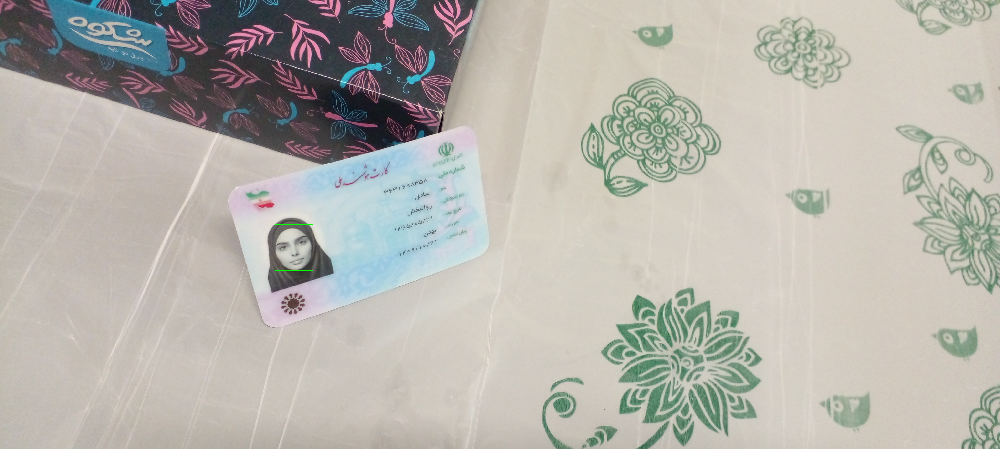

In [17]:
import insightface
import cv2
import numpy as np

# Load the model (e.g., buffalo_l for detection and recognition)
model = insightface.app.FaceAnalysis(name='buffalo_l')
model.prepare(ctx_id=0, det_size=(640, 640))  # ctx_id=0 for GPU, -1 for CPU

# Load an image
image = cv2.imread("/content/drive/MyDrive/images/98.jpg")

# Detect faces
faces = model.get(image)

# Process results
for face in faces:
    bbox = face.bbox.astype(int)  # Get bounding box coordinates
    score = face.det_score  # Confidence score
    print(f"Face detected at {bbox} with confidence {score}")

    # Draw rectangle on the image
    cv2.rectangle(image, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 2)

# Show the image with detected faces
cv2_imshow(image)

In [24]:
from retinaface import RetinaFace
img = cv2.imread("/content/drive/MyDrive/images/46.jpg")
obj = RetinaFace.detect_faces(img, threshold=0.9)

InternalError: Graph execution error:

Detected at node model/bn_data/FusedBatchNormV3 defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 205, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-21-3dfa6ef1a098>", line 2, in <cell line: 0>

  File "/usr/local/lib/python3.11/dist-packages/retinaface/RetinaFace.py", line 123, in detect_faces

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py", line 553, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py", line 558, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py", line 588, in __call__

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/base_layer.py", line 1142, in __call__

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/utils/traceback_utils.py", line 96, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/functional.py", line 514, in call

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/functional.py", line 671, in _run_internal_graph

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/base_layer.py", line 1142, in __call__

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/utils/traceback_utils.py", line 96, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/layers/normalization/batch_normalization.py", line 597, in call

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/layers/normalization/batch_normalization.py", line 990, in _fused_batch_norm

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/utils/control_flow_util.py", line 108, in smart_cond

  File "/usr/local/lib/python3.11/dist-packages/tf_keras/src/layers/normalization/batch_normalization.py", line 979, in _fused_batch_norm_inference

No DNN support for stream
	 [[{{node model/bn_data/FusedBatchNormV3}}]] [Op:__inference_function_8077]

# Rotation Code

In [36]:
def rotation(path):
    image = cv2.imread(path) # set image
    results = card_model(image) # run card yolo model for image
    if len(results[0].boxes) == 0: # if cant recognize card
        print("No card detected!")
        return None

    # set 4 corner location
    x1, y1, x2, y2 = map(int, results[0].boxes[0].xyxy[0])
    cropped_card = image[y1:y2, x1:x2]

    # check for faes
    faces = detector.detect_faces(cropped_card)
    if faces:
        x, y, w, h = faces[0]['box']
        face_center = (x + w // 2, y + h // 2) # face center location
        card_center = (cropped_card.shape[1] // 2, cropped_card.shape[0] // 2) # card center location
        angle = np.arctan2(face_center[1] - card_center[1], face_center[0] - card_center[0]) * (180 / np.pi) + 180 # angle of rotation
        rotation_matrix = cv2.getRotationMatrix2D(card_center, angle, 1.0) # make matrix for rotation
        rotated = cv2.warpAffine(cropped_card, rotation_matrix, (cropped_card.shape[1], cropped_card.shape[0])) # rotation image
        return rotated # return final image result
    else:
        # if cant find face
        return None


0: 640x288 1 Card, 13.0ms
Speed: 4.0ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 288)


AttributeError: module 'deepface.DeepFace' has no attribute 'detect_face'

# Use other model for text detection (Hezar)

In [24]:
def process_img(img):
    data = {}
    results = objects_model(img) # set part of object detection yolo model

    # dict for each box conf
    box_confidences = {}

    for result in results:
        boxes = result.boxes
        for box in boxes:
            xyxy = box.xyxy[0]
            x1, y1, x2, y2 = map(int, xyxy.tolist()) # set corner locations
            label = result.names[int(box.cls)] # set label
            conf = float(box.conf)  # set conf

            cropped_img = img[max(0, y1-3):y2+3, max(0, x1-3):x2+3] # cropped image location (with more nums for better conf)
            cv2_imshow(cropped_img)

            ocr_result = hezar_ocr.predict(cropped_img)  # read text with ocr

            if ocr_result:  # check if OCR returned results
                text_list = []
                for item in ocr_result:
                    text_list.append(item['text'])
                text = " ".join(text_list)  # retrun text
            else:
                text = "" # return empty str

            # best conf text (if have more than one)
            if label in box_confidences:
                if conf > box_confidences[label][1]:
                    box_confidences[label] = (text, conf)
            else:
                box_confidences[label] = (text, conf)

    # print label, text and conf
    for label, (text, conf) in box_confidences.items():
        print(f"Label: {label}, Text: {text}, Confidence: {conf}")
        data[label] = text.strip()

    return data

# Call function and use it

In [25]:
def detect(folder):
    detected = [] # set empty list
    for img in os.listdir(folder):
      # get images from folder and set csv columns
        if img.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.heic')):
            img_path = os.path.join(folder, img)
            data = {'image_id': img.split('.')[0], 'national_id': '', 'first_name': '', 'last_name': '',
                    'birth_year': '', 'birth_month': '', 'birth_day': '', 'father_name': '',
                    'expiry_year': '', 'expiry_month': '', 'expiry_day': ''}

            # rotation and crop card
            card = rotation(img_path)
            if card is None:
                continue

            # extract data from cropped image
            extracted_data = process_img(card)


            # set data in dict and in csv
            for key, value in extracted_data.items():
                value = re.sub(r'\s+', ' ', value).strip() # delete space from value (we have no white space in texts)
                if key == 'Expire': # set expiry date value in dict
                    try:
                        y, m, d = value.split('/') # splite to year, month and day
                        data['expiry_year'], data['expiry_month'], data['expiry_day'] = y, m, d # set expiry day, month and year
                    except ValueError:# if cant detect "/" well and get error
                        print(f"Error splitting Expire: {value}")
                elif key == 'Birth': # set birth date value in dict
                    try:
                        y, m, d = value.split('/') # splite to year, month and day
                        data['birth_year'], data['birth_month'], data['birth_day'] = y, m, d # set birth day, month and year
                    except ValueError: # if cant detect "/" well and get error
                        print(f"Error splitting Birth: {value}")
                elif key == 'National': # set national id value in dict
                    data['national_id'] = value
                elif key == 'Name': # set name value in dict
                    data['first_name'] = value
                elif key == 'LastName': # set last name value in dict
                    data['last_name'] = value
                elif key == 'FatherName': # set father name value in dict
                    data['father_name'] = value

            detected.append(data)

    pd.DataFrame(detected).to_csv('image_phase2.csv', index=False, encoding='utf-8')
    return detected

In [37]:
detect('/content/drive/MyDrive/images/')


0: 640x288 1 Card, 14.8ms
Speed: 3.2ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


AttributeError: module 'deepface.DeepFace' has no attribute 'detect_face'

# Sort csv

In [ ]:
df = pd.read_csv('image_phase2.csv')
df = df.sort_values(by='image_id')
df.to_csv("image_phase2.csv", index=False)